In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))
#     break
# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import warnings
warnings.filterwarnings('ignore')
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import classification_report , confusion_matrix , accuracy_score , auc
from sklearn.model_selection import train_test_split

import cv2
#from google.colab.patches import cv2_imshow
from PIL import Image 
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Input, Dense,Conv2D , MaxPooling2D, Flatten,BatchNormalization,Dropout
from tensorflow.keras.preprocessing import image_dataset_from_directory
import tensorflow_hub as hub

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2 , ResNet152
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential

In [3]:
#path = "/kaggle/input/kermany2018/OCT2017 /"

In [4]:
# path = "/kaggle/input/kermany2018/OCT2017 /train/CNV/CNV-1016042-1.jpeg"
# image = plt.imread(path)
# image.shape

In [5]:
train = image_dataset_from_directory("/kaggle/input/kermany2018/OCT2017 /train",color_mode="grayscale",
                                    image_size=(224,224),batch_size=512,shuffle=True)

Found 83484 files belonging to 4 classes.


In [6]:
test = image_dataset_from_directory("/kaggle/input/kermany2018/OCT2017 /test", color_mode="grayscale",
                                    image_size=(224,224),batch_size=512,shuffle=True)

Found 968 files belonging to 4 classes.


In [7]:
val = image_dataset_from_directory("/kaggle/input/kermany2018/OCT2017 /val", color_mode="grayscale",
                                    image_size=(224,224),batch_size=512,shuffle=True)

Found 32 files belonging to 4 classes.


In [8]:
class_labels = train.class_names
class_labels

['CNV', 'DME', 'DRUSEN', 'NORMAL']

In [9]:
for img_batch, label in train.take(1):
    print(img_batch.shape)
    print(label)
    break

(512, 224, 224, 1)
tf.Tensor(
[3 2 0 1 0 0 1 2 2 1 0 3 3 3 3 0 1 1 3 0 0 0 3 0 0 0 0 0 3 0 0 2 0 0 3 0 0
 0 0 2 0 3 3 1 2 0 1 0 0 0 0 3 0 3 0 0 3 3 0 3 3 2 0 1 0 3 1 0 3 0 1 2 2 0
 0 0 0 3 2 0 3 3 1 1 3 3 1 0 0 0 3 3 3 3 0 0 0 3 2 0 0 3 3 0 3 3 3 0 2 1 3
 3 3 2 3 0 1 2 0 0 3 3 1 0 3 3 3 3 2 0 0 0 1 0 1 0 0 0 3 0 1 0 3 0 3 0 0 0
 2 1 1 3 3 3 2 0 1 0 3 0 0 3 0 3 0 0 3 3 3 0 0 3 0 1 3 3 1 3 3 0 0 3 3 3 3
 1 3 1 2 1 0 1 3 3 3 0 3 2 0 2 0 3 0 1 0 3 1 3 3 3 0 0 3 2 0 3 1 0 2 0 3 1
 3 0 3 1 2 1 2 1 1 3 3 1 0 1 3 0 3 0 3 0 0 1 3 2 0 1 0 0 0 0 0 0 0 1 2 1 3
 3 0 3 3 0 0 0 0 0 1 1 3 0 3 0 0 3 3 2 0 0 3 0 0 3 0 2 3 0 3 1 1 0 0 0 0 3
 3 3 3 0 1 1 3 0 1 0 0 1 3 0 2 0 2 1 3 3 3 0 0 3 0 0 0 0 3 0 3 0 1 0 0 3 1
 0 3 0 3 0 0 3 2 1 3 3 0 0 1 3 1 3 3 1 0 0 0 1 2 3 1 3 0 2 1 0 0 3 2 3 0 2
 3 3 0 1 1 0 2 0 0 3 3 3 0 2 3 0 3 0 3 3 3 0 3 0 1 0 0 3 0 1 3 0 3 0 3 0 3
 0 2 3 0 0 0 3 0 1 1 2 3 3 0 1 3 0 2 3 3 0 0 3 1 0 0 0 0 3 3 0 3 3 2 0 0 3
 0 3 0 3 1 0 3 0 1 0 3 2 3 1 1 3 0 3 0 2 2 3 3 3 1 3 2 3 3 3 1 3 3 0 3

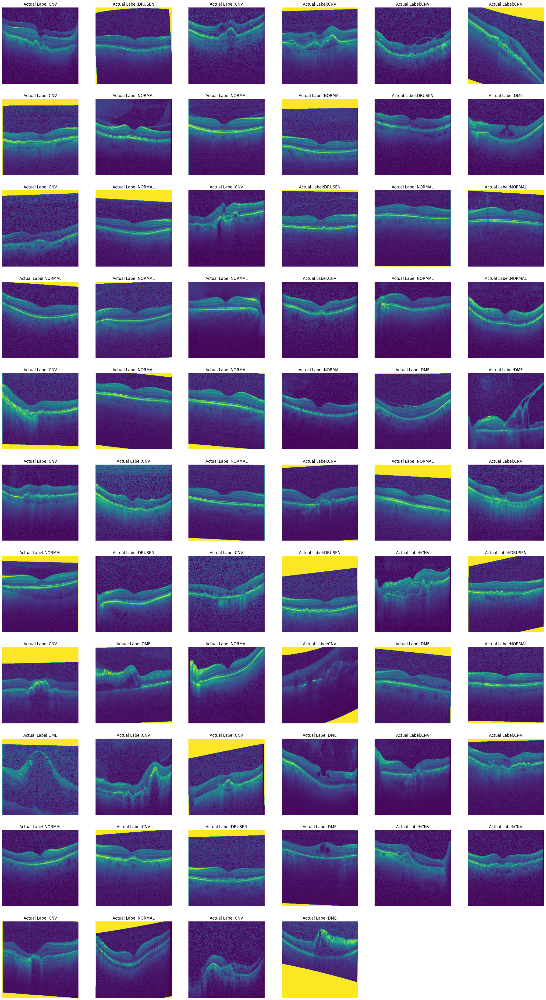

In [10]:
plt.figure(figsize=(30,55))
for img_batch, label in train.take(1):
    for i in range(64):
        plt.subplot(11,6,i+1)
        plt.imshow(img_batch[i])
        plt.title(f"Actual Label:{class_labels[label[i]]}")
        plt.axis("off")
    break

In [11]:
# Create an ImageDataGenerator with scaling and data augmentation
datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Scale pixel values to the range [0, 1]
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True
)

# Load and preprocess the images using the generator
batch_size = 512  # Adjust the batch size according to your needs
image_size = (224,224)

train_data_generator = datagen.flow_from_directory(
    "/kaggle/input/kermany2018/OCT2017 /train",
    target_size=image_size,
    batch_size=batch_size,
    class_mode='sparse',
    #subset='training',  # Specify 'training' to get the training set
    shuffle=True
)

Found 83484 images belonging to 4 classes.


In [12]:
test_data_generator = datagen.flow_from_directory(
    "/kaggle/input/kermany2018/OCT2017 /test",
    target_size=image_size,
    batch_size=batch_size,
    class_mode='sparse',
    #subset='validation',  # Specify 'validation' to get the validation set
    shuffle=True
)

Found 968 images belonging to 4 classes.


In [13]:
val_data_generator = datagen.flow_from_directory(
    "/kaggle/input/kermany2018/OCT2017 /val",
    target_size=image_size,
    batch_size=batch_size,
    class_mode='sparse',
    #subset='validation',  # Specify 'validation' to get the validation set
    shuffle=True
)

Found 32 images belonging to 4 classes.


In [14]:
train_data_generator.class_indices

{'CNV': 0, 'DME': 1, 'DRUSEN': 2, 'NORMAL': 3}

## Pre-Trained Model

In [15]:
path = "/kaggle/input/mobilenet-v2/tensorflow2/100-224-classification/2"
model_hub = hub.KerasLayer(path, input_shape=(224,224,3), trainable=False)

num_class = 4
model = Sequential()
model.add(model_hub)
model.add(Dense(1000,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(1000,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(units=num_class, activation="softmax"))


model.compile(optimizer="adam",loss="sparse_categorical_crossentropy",
             metrics=["accuracy"])


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 1000)              1002000   
                                                                 
 dropout (Dropout)           (None, 1000)              0         
                                                                 
 dense_1 (Dense)             (None, 1000)              1001000   
                                                                 
 dropout_1 (Dropout)         (None, 1000)              0         
                                                                 
 dense_2 (Dense)             (None, 4)                 4004      
                                                                 
Total params: 5,547,269
Trainable params: 2,007,004
Non-

In [16]:
history = model.fit(train_data_generator , epochs=5 , batch_size=512,
                  verbose=1, validation_data=val_data_generator)

Epoch 1/5
164/164 [==============================] - 1478s 9s/step - loss: 0.6351 - accuracy: 0.7885 - val_loss: 0.2117 - val_accuracy: 0.8438
Epoch 2/5
164/164 [==============================] - 1096s 7s/step - loss: 0.4218 - accuracy: 0.8454 - val_loss: 0.2103 - val_accuracy: 0.9062
Epoch 3/5
164/164 [==============================] - 1086s 7s/step - loss: 0.3988 - accuracy: 0.8543 - val_loss: 0.2877 - val_accuracy: 0.8750
Epoch 4/5
164/164 [==============================] - 1118s 7s/step - loss: 0.3893 - accuracy: 0.8576 - val_loss: 0.1971 - val_accuracy: 0.9062
Epoch 5/5
164/164 [==============================] - 1086s 7s/step - loss: 0.3797 - accuracy: 0.8621 - val_loss: 0.1816 - val_accuracy: 0.9062


## Model Evaluation On Train & Test Data

In [17]:
model.save("model_224x224.h5")

In [18]:
loss,acc = model.evaluate(train_data_generator)
print("Accuracy on Train Data:",acc)
print()
loss,acc = model.evaluate(test_data_generator)
print("Accuracy on Test Data:",acc)

164/164 [==============================] - 1094s 7s/step - loss: 0.3490 - accuracy: 0.8713
Accuracy on Train Data: 0.87131667137146

2/2 [==============================] - 21s 14s/step - loss: 0.2837 - accuracy: 0.8864
Accuracy on Test Data: 0.8863636255264282


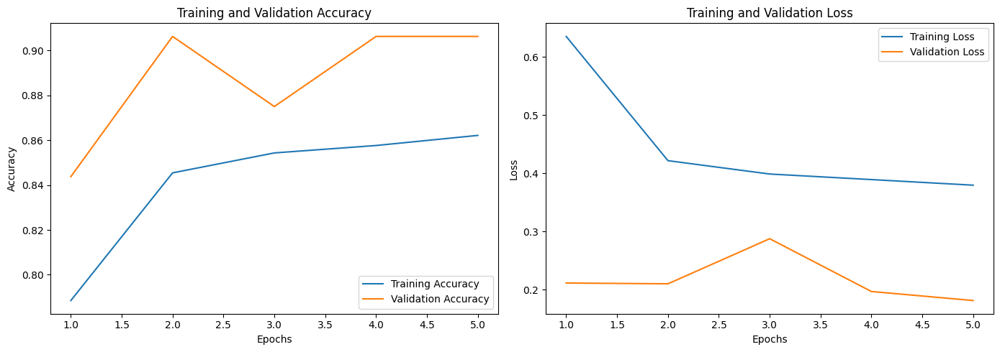

In [20]:
import matplotlib.pyplot as plt

# Extract accuracy and loss values from the history object
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Extract the number of epochs
epochs = range(1, len(train_accuracy) + 1)

# Plot training and validation accuracy
plt.figure(figsize=(14, 5))

# Subplot for accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, train_accuracy, label='Training Accuracy')
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Subplot for loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.tight_layout()
plt.show()
